using device cpu
Loading: /Users/christiankwok/my wunderfund_challenge/wunderfund_challenge/competition_package/examples/r2.3364/lstm_weights.pt
Shapes: (936, 32) (936, 32)


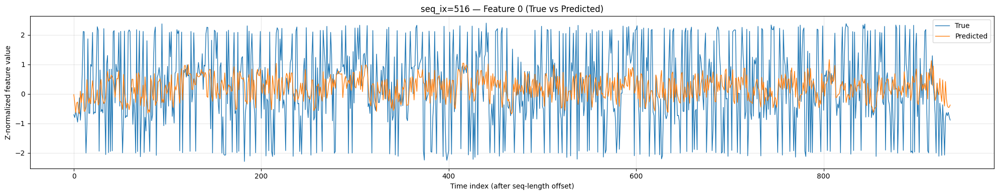

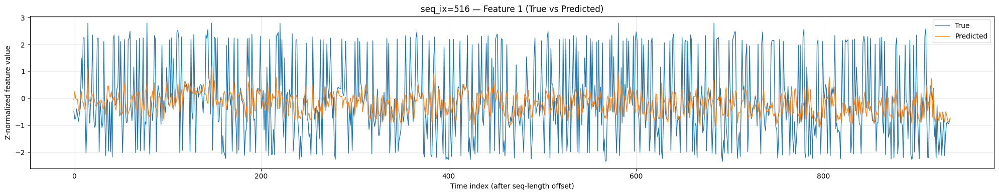

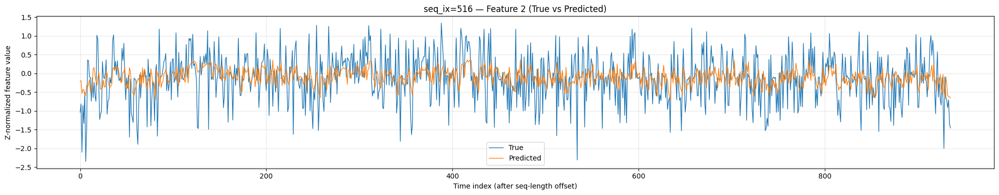

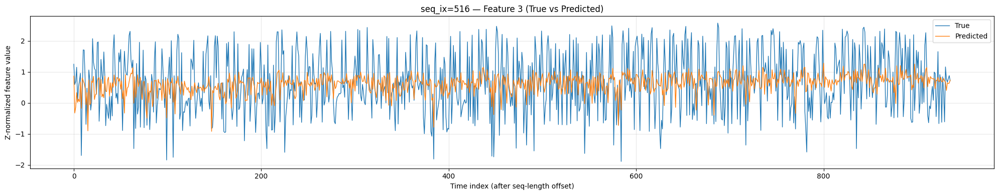

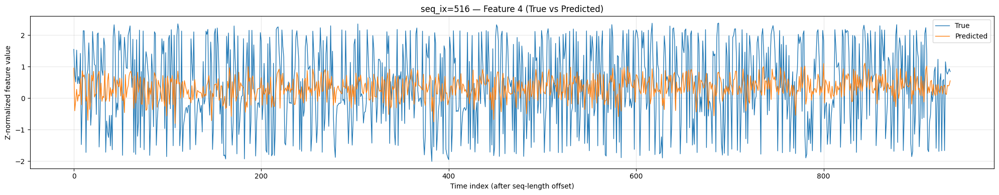

...

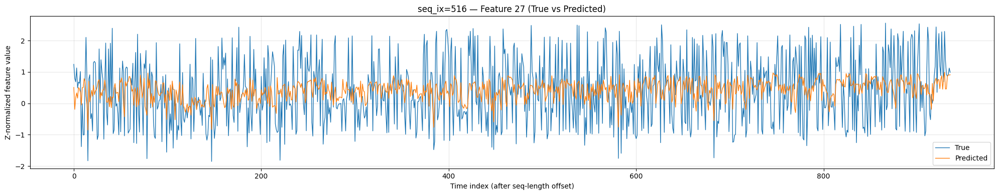

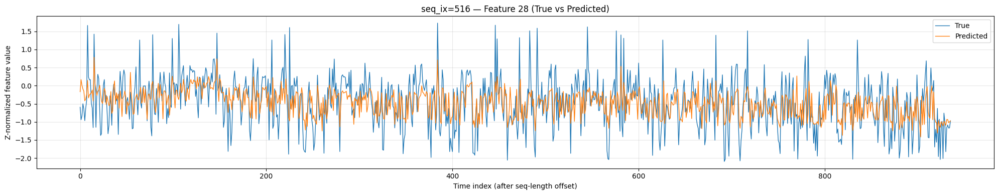

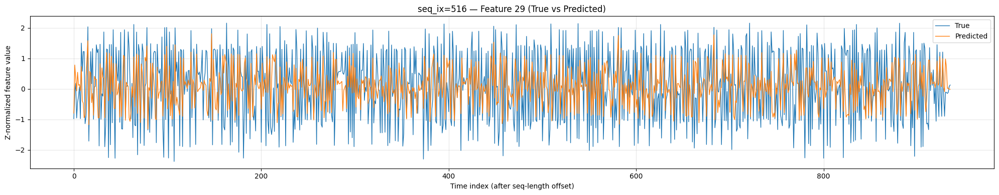

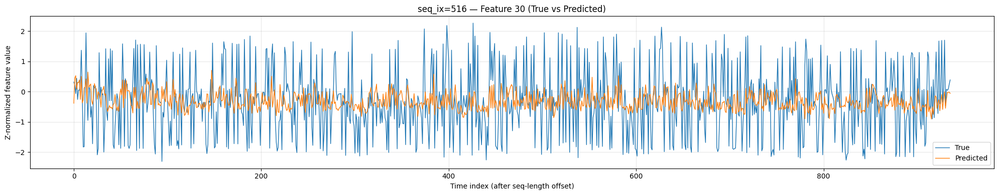

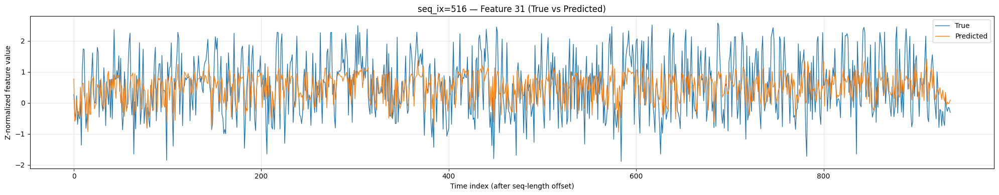


Done plotting ✓


In [15]:
import os
import sys
import numpy as np
import torch
import torch.nn as nn
import pandas as pd
import matplotlib.pyplot as plt

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("using device", DEVICE)

CURRENT_DIR = os.getcwd()     # notebook friendly
sys.path.append(f"{CURRENT_DIR}/../..")
from utils import ScorerStepByStep


# ───────────────────────────────────────────────
# Model — SAME architecture as solution.py
# ───────────────────────────────────────────────
class PredictionModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.input_dim = 64
        self.output_dim = 32
        self.hidden_size = 64
        self.num_layers = 1

        self.lstm = nn.LSTM(
            input_size=self.input_dim,
            hidden_size=self.hidden_size,
            num_layers=self.num_layers,
            batch_first=True
        )
        self.fc = nn.Linear(self.hidden_size, self.output_dim)

        weights_path = os.path.join(CURRENT_DIR, "lstm_weights.pt")
        print("Loading:", weights_path)
        self.load_state_dict(torch.load(weights_path, map_location=DEVICE))
        self.to(DEVICE)

    def forward(self, x):
        out, _ = self.lstm(x)
        return self.fc(out[:, -1])


# window function EXACTLY like solution
def make_sequences(arr64, seq_len=64):
    X, y = [], []
    for i in range(len(arr64) - seq_len):
        X.append(arr64[i:i+seq_len])
        y.append(arr64[i+seq_len, :32])
    return np.stack(X), np.stack(y)


# ───────────────────────────────────────────────
# 🔧 CHANGE THIS to look at a different sequence
# ───────────────────────────────────────────────
seq_id = 516   # change this to inspect another sequence

train_file = f"{CURRENT_DIR}/../../datasets/train.parquet"
scorer = ScorerStepByStep(train_file)
df = scorer.dataset

# extract a full ordered sequence
df_seq = (
    df[df["seq_ix"] == seq_id]
    .sort_values("step_in_seq")
    .reset_index(drop=True)
)

# raw 32 features → columns 3 to 34 (inclusive)
raw = df_seq.iloc[:, 3:35].to_numpy().astype(np.float32)

# rolling mean (5)
rm5 = pd.DataFrame(raw).rolling(5, min_periods=1).mean().to_numpy().astype(np.float32)

# full 64-dim input = raw + rm5
arr64 = np.concatenate([raw, rm5], axis=1).astype(np.float32)



# ───────────────────────────────────────────────
# Load dataset and filter to one sequence (no shuffling)
# ───────────────────────────────────────────────
train_file = f"{CURRENT_DIR}/../../datasets/train.parquet"
scorer = ScorerStepByStep(train_file)
df = scorer.dataset

df_seq = df[df["seq_ix"] == seq_id].sort_values('step_in_seq').reset_index(drop=True)

raw = df_seq.iloc[:, 3:35].to_numpy().astype(np.float32)
rm5 = pd.DataFrame(raw).rolling(5, min_periods=1).mean().to_numpy().astype(np.float32)
arr64 = np.concatenate([raw, rm5], axis=1).astype(np.float32)      # (T_seq, 64)


# make windows
seq_len = 64
X_np, y_true = make_sequences(arr64, seq_len=seq_len)
X = torch.tensor(X_np, dtype=torch.float32).to(DEVICE)


# ───────────────────────────────────────────────
# Predict
# ───────────────────────────────────────────────
model = PredictionModel()
model.eval()
with torch.no_grad():
    y_pred = model(X).cpu().numpy()

print("Shapes:", y_true.shape, y_pred.shape)


# ───────────────────────────────────────────────
# Plot ALL 32 features
# ───────────────────────────────────────────────
for k in range(32):
    plt.figure(figsize=(20, 4))

    plt.plot(y_true[:, k], label="True", linewidth=1)
    plt.plot(y_pred[:, k], label="Predicted", linewidth=1)
    plt.title(f"seq_ix={seq_id} — Feature {k} (True vs Predicted)")
    plt.xlabel("Time index (after seq-length offset)")
    plt.ylabel("Z-normalized feature value")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

print("\nDone plotting ✓")
